<a href="https://www.kaggle.com/code/ragaa5/skin-cancer-classification3?scriptVersionId=122404528" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras

In [2]:
# open file 
import os
print(os.listdir("/kaggle/input")) # open file
print("-----------------------------------------")

['skin-cancer9-classesisic', 'ham1000-segmentation-and-classification']
-----------------------------------------


In [3]:
trainpath = "/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train"
testpath = "/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test"
predpath = "/kaggle/input/ham1000-segmentation-and-classification/images"

In [4]:
results2 = []
for folder in  os.listdir(trainpath + '/') : 
    dies_name_count = {}
    files = gb.glob(pathname= str( trainpath +'/' + folder + '/*.jpg'))
    dies_name_count['disease']=folder
    dies_name_count['count_images']=len(files)
    results2.append(dies_name_count)
    print(f'For training data , found {len(files)} in folder {folder}')
pd.DataFrame(results2)

For training data , found 462 in folder pigmented benign keratosis
For training data , found 438 in folder melanoma
For training data , found 139 in folder vascular lesion
For training data , found 114 in folder actinic keratosis
For training data , found 181 in folder squamous cell carcinoma
For training data , found 376 in folder basal cell carcinoma
For training data , found 77 in folder seborrheic keratosis
For training data , found 95 in folder dermatofibroma
For training data , found 357 in folder nevus


,disease,count_images
0,pigmented benign keratosis,462
1,melanoma,438
2,vascular lesion,139
3,actinic keratosis,114
4,squamous cell carcinoma,181
5,basal cell carcinoma,376
6,seborrheic keratosis,77
7,dermatofibroma,95
8,nevus,357


In [5]:
results2 = []
for folder in  os.listdir(testpath + '/') : 
    dies_name_count = {}
    files = gb.glob(pathname= str( testpath +'/' + folder + '/*.jpg'))
    dies_name_count['disease']=folder
    dies_name_count['count_images']=len(files)
    results2.append(dies_name_count)
    print(f'For testing data , found {len(files)} in folder {folder}')
pd.DataFrame(results2)

For testing data , found 16 in folder pigmented benign keratosis
For testing data , found 16 in folder melanoma
For testing data , found 3 in folder vascular lesion
For testing data , found 16 in folder actinic keratosis
For testing data , found 16 in folder squamous cell carcinoma
For testing data , found 16 in folder basal cell carcinoma
For testing data , found 3 in folder seborrheic keratosis
For testing data , found 16 in folder dermatofibroma
For testing data , found 16 in folder nevus


,disease,count_images
0,pigmented benign keratosis,16
1,melanoma,16
2,vascular lesion,3
3,actinic keratosis,16
4,squamous cell carcinoma,16
5,basal cell carcinoma,16
6,seborrheic keratosis,3
7,dermatofibroma,16
8,nevus,16


In [6]:
code = {'actinic keratosis':3 ,'basal cell carcinoma':5,'dermatofibroma':7,'melanoma':1,'nevus':8,'pigmented benign keratosis':0,'seborrheic keratosis':6,'squamous cell carcinoma':7,'vascular lesion':2}
def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    

In [7]:
size = []
for folder in  os.listdir(trainpath +'/') : 
    files = gb.glob(pathname= str( trainpath +'/' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(450, 600, 3)      1443
(768, 1024, 3)      393
(2304, 3072, 3)      84
(576, 767, 3)        80
(802, 919, 3)        60
                   ... 
(750, 771, 3)         1
(1936, 1936, 3)       1
(1603, 2198, 3)       1
(720, 964, 3)         1
(640, 957, 3)         1
Length: 76, dtype: int64

In [8]:
size = []
for folder in  os.listdir(testpath +'/') : 
    files = gb.glob(pathname= str( testpath +'/' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(450, 600, 3)      69
(767, 1022, 3)     17
(1129, 1504, 3)    14
(768, 1024, 3)      5
(4419, 6668, 3)     2
(1129, 1503, 3)     1
(4399, 6668, 3)     1
(4391, 6641, 3)     1
(4421, 6641, 3)     1
(4439, 6688, 3)     1
(1936, 1936, 3)     1
(4380, 6601, 3)     1
(4439, 6648, 3)     1
(4479, 6668, 3)     1
(2848, 4288, 3)     1
(4459, 6648, 3)     1
dtype: int64

In [9]:
predpath="/kaggle/input/ham1000-segmentation-and-classification/images"
size = []
files = gb.glob(pathname= str(predpath +'/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(450, 600, 3)    10015
dtype: int64

In [10]:
s = 200

In [11]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'/') : 
    files = gb.glob(pathname= str( trainpath +'/' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

In [12]:
print(f'we have {len(X_train)} items in X_train')

we have 2239 items in X_train


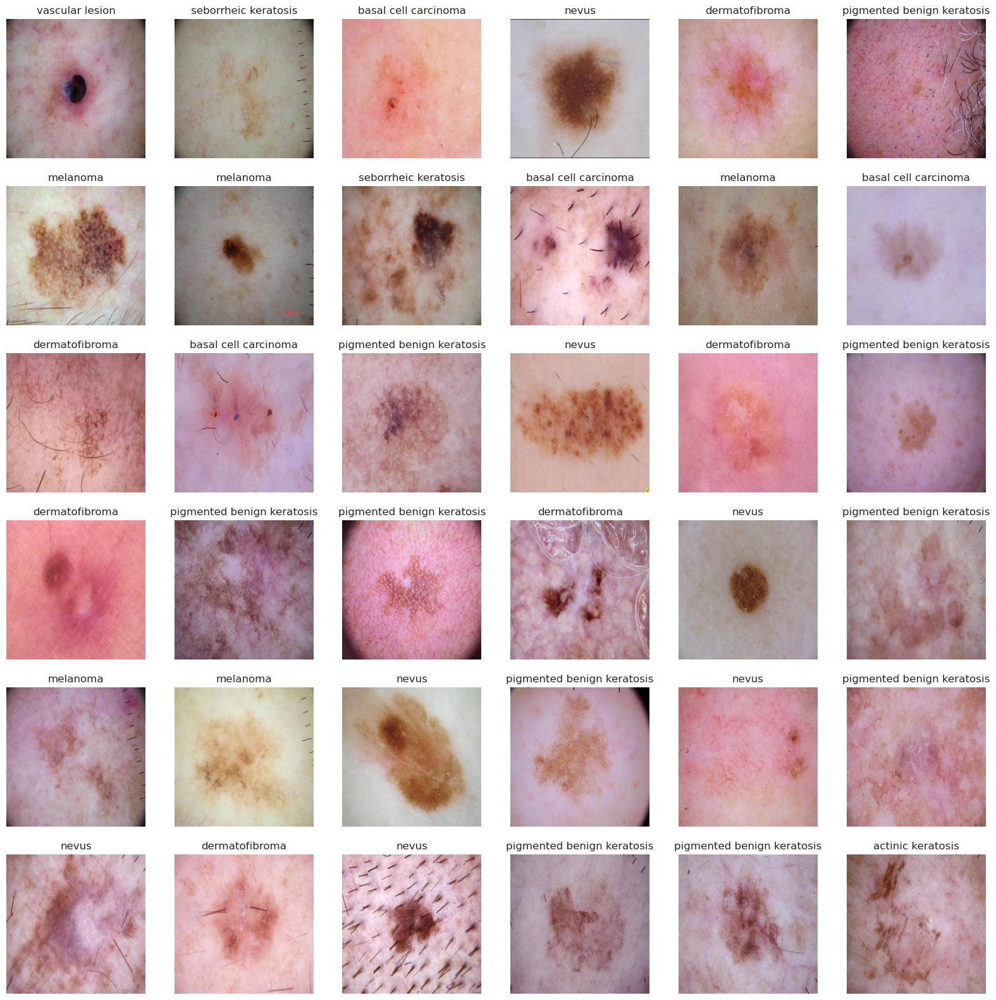

In [13]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [14]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'/') : 
    files = gb.glob(pathname= str(testpath + '/' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])

In [15]:
print(f'we have {len(X_test)} items in X_test')

we have 118 items in X_test


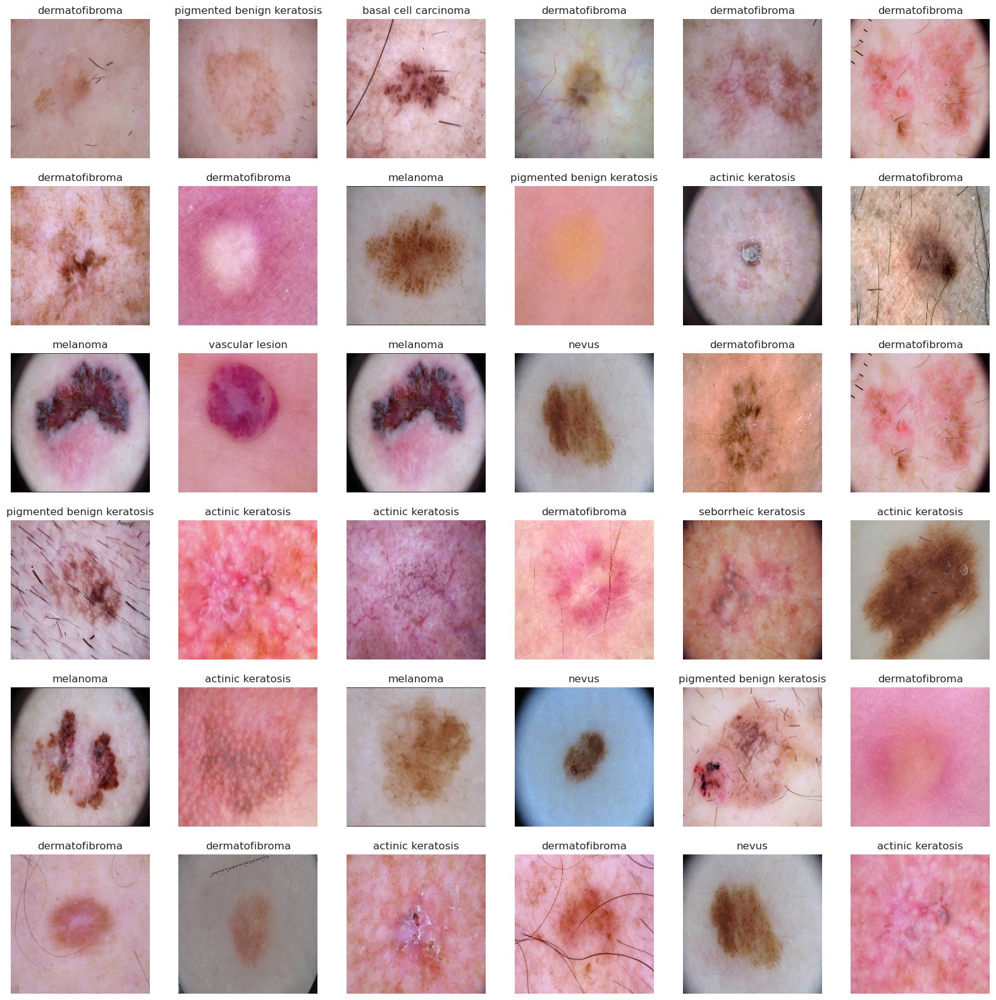

In [16]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [17]:
X_pred = []
files = gb.glob(pathname= str(predpath + '/*.jpg'))
for file in files: 
    image = plt.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))      

In [18]:
print(f'we have {len(X_pred)} items in X_pred')

we have 10015 items in X_pred


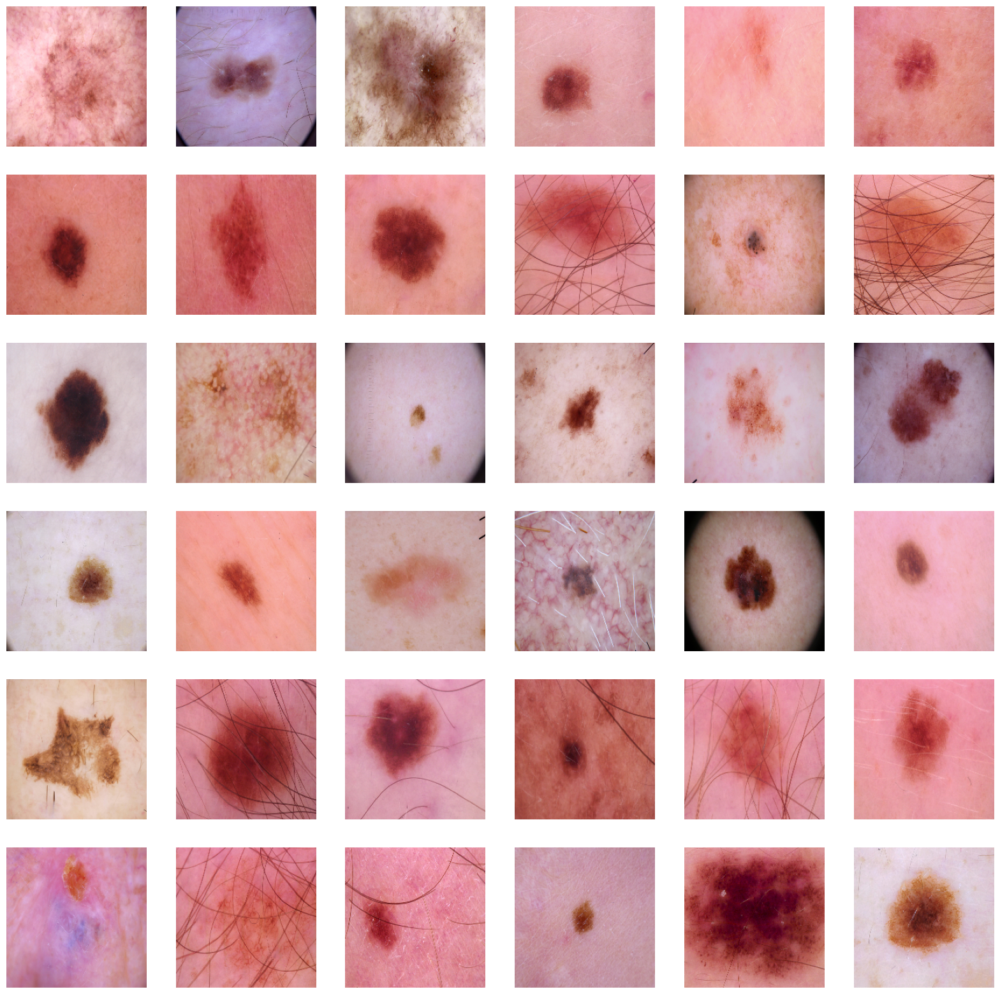

In [19]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

In [20]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)
print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (2239, 200, 200, 3)
X_test shape  is (118, 200, 200, 3)
X_pred shape  is (10015, 200, 200, 3)
y_train shape  is (2239,)
y_test shape  is (118,)


In [21]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(180,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(110,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(100,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(150,activation='relu') ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,        
        keras.layers.Dropout(rate=0.25) ,            
        keras.layers.Dense(9,activation='softmax') ,    
        ])

In [22]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [23]:
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 200)     5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 196, 196, 180)     324180    
                                                                 
 conv2d_2 (Conv2D)           (None, 194, 194, 150)     243150    
                                                                 
 conv2d_3 (Conv2D)           (None, 192, 192, 120)     162120    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 48, 48, 120)      0         
 )                                                               
                                                                 
 conv2d_4 (Conv2D)           (None, 46, 46, 110)       118910    
                                   

In [24]:
epochs = 70
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/70
35/35 [==============================] - 178s 4s/step - loss: 2.5761 - accuracy: 0.1644
Epoch 2/70
35/35 [==============================] - 94s 3s/step - loss: 1.9838 - accuracy: 0.1822
Epoch 3/70
35/35 [==============================] - 94s 3s/step - loss: 1.9853 - accuracy: 0.2023
Epoch 4/70
35/35 [==============================] - 94s 3s/step - loss: 1.9717 - accuracy: 0.1974
Epoch 5/70
35/35 [==============================] - 94s 3s/step - loss: 1.9630 - accuracy: 0.2028
Epoch 6/70
35/35 [==============================] - 94s 3s/step - loss: 1.9382 - accuracy: 0.2251
Epoch 7/70
35/35 [==============================] - 94s 3s/step - loss: 1.9086 - accuracy: 0.2506
Epoch 8/70
35/35 [==============================] - 93s 3s/step - loss: 1.9231 - accuracy: 0.2443
Epoch 9/70
35/35 [==============================] - 93s 3s/step - loss: 1.8680 - accuracy: 0.2430
Epoch 10/70
35/35 [==============================] - 93s 3s/step - loss: 1.8362 - accuracy: 0.2832
Epoch 11/70
35/35 

In [25]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

4/4 [==============================] - 9s 1s/step - loss: 6.6940 - accuracy: 0.3220
Test Loss is 6.6940202713012695
Test Accuracy is 0.32203391194343567


In [26]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_train, y_train)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

70/70 [==============================] - 23s 322ms/step - loss: 0.2112 - accuracy: 0.8986
Test Loss is 0.21116749942302704
Test Accuracy is 0.8986154794692993


In [27]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

4/4 [==============================] - 1s 244ms/step
Prediction Shape is (118, 9)


In [28]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

313/313 [==============================] - 76s 245ms/step
Prediction Shape is (10015, 9)


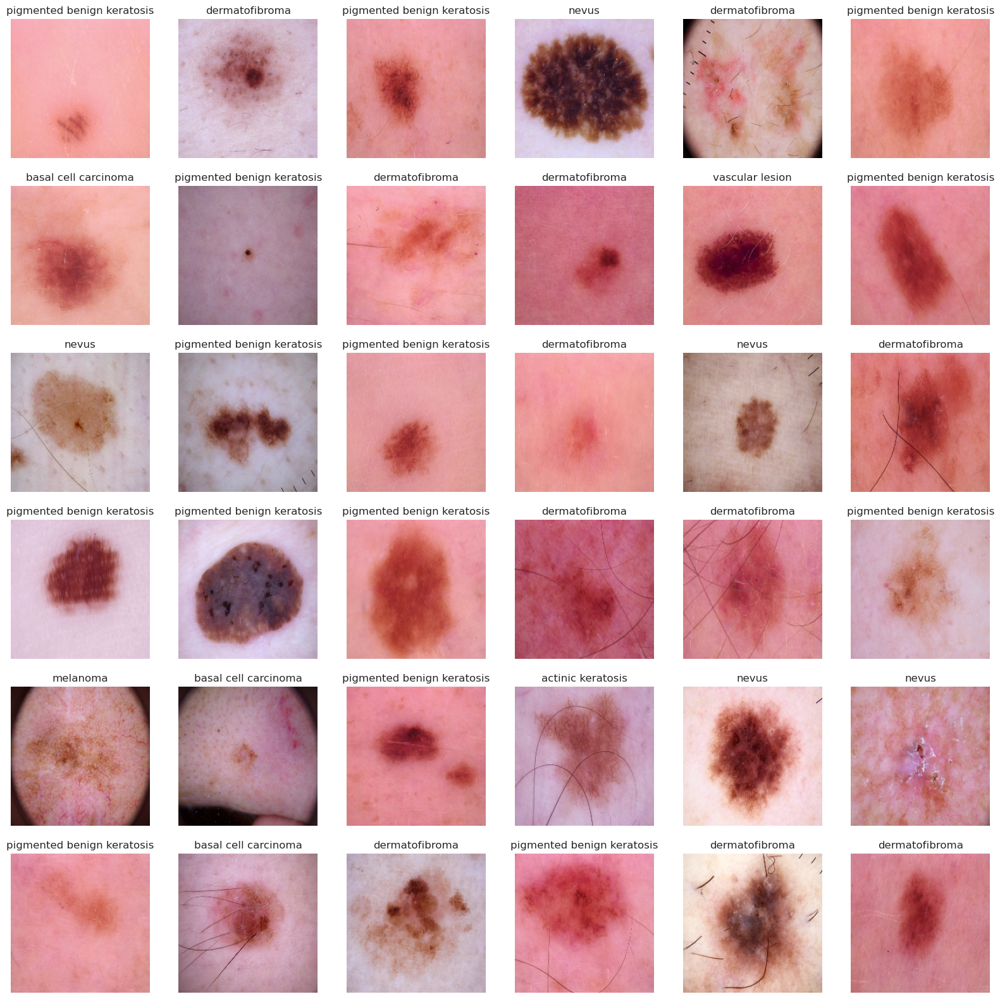

In [29]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

In [30]:
KerasModel.save('v1_alpaca_model.h5')

In [31]:
KerasModel.save_weights('v1_alpaca_weights.h5')